# Compare AE and VAE side-by-side on CelebA

## Install dependencies

In [ ]:
from typing import Sequence
from itertools import islice
import subprocess

import jax
import jax.numpy as jnp
import numpy as np

try:
    import tensorflow as tf
except ModuleNotFoundError:
    # flax.training.checkpoints depends on tensorflow,
    # which is only installed by default on Colab
    %pip install -qq tensorflow-cpu
    import tensorflow as tf

tf.config.set_visible_devices([], "GPU")  # prevent TensorFlow from using the GPU

try:
    import flax
except ModuleNotFoundError:
    %pip install -qq flax
    import flax
from flax.training import checkpoints

try:
    import optax
except ModuleNotFoundError:
    os.system("pip install -qq optax")

try:
    import torchvision.transforms as T
except ModuleNotFoundError:
    %pip install -qq torchvision
    import torchvision.transforms as T
from torchvision.datasets import CelebA

try:
    import torch
except ModuleNotFoundError:
    %pip install -qq torch
    import torch
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt

     |████████████████████████████████| 197 kB 6.2 MB/s 
     |████████████████████████████████| 596 kB 14.3 MB/s 
     |████████████████████████████████| 217 kB 18.5 MB/s 
     |████████████████████████████████| 145 kB 26.0 MB/s 
     |████████████████████████████████| 51 kB 5.4 MB/s 
     |████████████████████████████████| 72 kB 665 kB/s 


In [ ]:
%pip install -qq git+https://github.com/probml/probml-utils.git

from probml_utils.conv_vae_flax_utils import create_train_state, train_step, test_step, decode

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 272 kB 9.7 MB/s 
     |████████████████████████████████| 88 kB 8.8 MB/s 
     |████████████████████████████████| 125 kB 70.9 MB/s 
     |████████████████████████████████| 1.1 MB 68.5 MB/s 


## Create directories

In [ ]:
!mkdir /content/celeba
!mkdir /content/ckpts
!mkdir /content/plots

## Download dataset

In [ ]:
# Download the dataset from an interal mirror since the Google Drive has bandwidth limit.
# 
# The files were manually downloaded from the Google Drive at https://docs.google.com/uc?export=download&id={{ FILE_ID }}
# and then uploaded to the mirror server, where FILE_ID can be found at https://github.com/pytorch/vision/blob/3db30442a52e250c569ba131485fc432c8300f16/torchvision/datasets/celeba.py#L47-L58
# Just place them in /content/celeba and unzip img_align_celeba.zip; no other preprocessing is needed.

!wget -r -np -nc -nH -q --cut-dirs=1 -R "index.html*" https://internal-use.adroits.xyz/datasets/celeba/ -P /content
!unzip -d /content/celeba -qq /content/celeba/img_align_celeba.zip 

In [ ]:
torch.manual_seed(42)

transform = T.Compose([
    T.RandomHorizontalFlip(),
    T.CenterCrop((128, 128)),
    T.Resize((64, 64)),
    np.array
])

# No need to specify download=True since we have placed the dataset files in /content
celeba_train = CelebA("/content", split="train", transform=transform)
celeba_test = CelebA("/content", split="test", transform=transform)

## Hyperparameters

In [ ]:
ckpt_dir = "/content/ckpts"
epochs = 5
batch_size = 256
latent_dim = 256
hidden_channels = (32, 64, 128, 256, 512)
lr = 1e-3
specimen = jnp.empty((64, 64, 3))

configs = {
    "ae": (False, 0),
    "vae_0.1": (True, 0.1),
    "vae_0.5": (True, 0.5),
    "vae_1.0": (True, 1),
}

## Prepare checkpoints

Either by downloading or training

In [ ]:
def train(name, variational, beta, loader_train, target_epoch):
    print(f"=== Training {name} ===")
    key = jax.random.PRNGKey(42)
    state = create_train_state(key, variational, beta, latent_dim, hidden_channels, lr, specimen)

    for epoch in range(target_epoch):
        loss_train = 0
        for X, _ in loader_train:
            image = jnp.array(X).reshape((-1, *specimen.shape)) / 255.0
            key, key_Z = jax.random.split(key)
            state, loss = train_step(state, key_Z, image)
            loss_train += loss

        print(f"Epoch {epoch + 1}: train loss {loss_train}")

        # Keep the model with lowest loss_train
        checkpoints.save_checkpoint(ckpt_dir, state, epoch + 1, prefix=f"{name}_celeba_",
                                    keep=target_epoch, overwrite=True)


def prepare_checkpoints(target_epoch, download=True):
    # Download pre-trained checkpoints by default to save time. At the time
    # of writing, we have prepared the checkpoints for the first 5 epochs,
    # so target_epoch must be less than or equal to 5.
    #
    # NOTE: You may want to deletes all existing checkpoints before downloading.
    if download:
        # print("Deleting existing checkpoints")
        # subprocess.run(["rm", "-rf", ckpt_dir])
        # subprocess.run(["mkdir", ckpt_dir])
        for name in configs:
            url = f"https://internal-use.adroits.xyz/ckpts/celeba_vae_ae_comparison/{name}_celeba_{target_epoch}"
            print("Downloading", url)
            subprocess.run(["wget", "-q", url, "-P", ckpt_dir], check=True)
        return

    # Alternatively, you can train the model from scratch if you want to tune
    # the hyperparameters. It takes ~4 minutes per epoch per model on a GPU
    # runtime with a Tesla P100 GPU.
    loader_train = DataLoader(celeba_train, batch_size, shuffle=True,
                            generator=torch.Generator().manual_seed(42))

    for name, (variational, beta) in configs.items():
        train(name, variational, beta, loader_train, target_epoch)


prepare_checkpoints(epochs, download=True)

## Load checkpoints

In [ ]:
states = {}

for name, (variational, beta) in configs.items():
    key = jax.random.PRNGKey(42)
    state = create_train_state(key, variational, beta, latent_dim, hidden_channels, lr, specimen)
    restored = checkpoints.restore_checkpoint(ckpt_dir, state, prefix=f"{name}_celeba_")
    if state is restored:
        raise FileNotFoundError(f"Cannot load checkpoint from {ckpt_dir}/{name}_celeba_X")
    states[name] = restored

## Visualization of reconstructed images

In [ ]:
loader_test = DataLoader(celeba_test, batch_size, shuffle=True,
                         generator=torch.Generator().manual_seed(42))
X, y = next(iter(loader_test))
image = jnp.array(X).reshape((-1, *specimen.shape)) / 255.0

recons = { "original": image, }
key = jax.random.PRNGKey(42)
key, *key_Z = jax.random.split(key, 5)
for i, name in enumerate(configs):
    recon, _, _ = test_step(states[name], key_Z[i], image)
    recons[name] = recon

Show a single figure montage

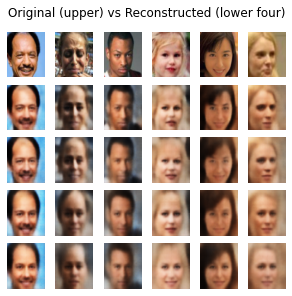

In [ ]:
fig, axes = plt.subplots(5, 6, constrained_layout=True, figsize=plt.figaspect(1))
for row, (name, recon) in enumerate(recons.items()):
    for col in range(6):
        axes[row, col].imshow(recon[col], aspect=218/178)
        axes[row, col].axis("off")

fig.suptitle("Original (upper) vs Reconstructed (lower four)")
fig.show()
plt.savefig("/content/plots/celeba_recon_montage.pdf")

Plot each row as a separate figure and then save them with meaningful filenames

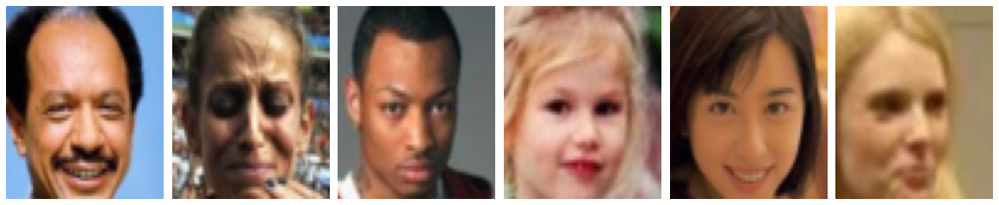

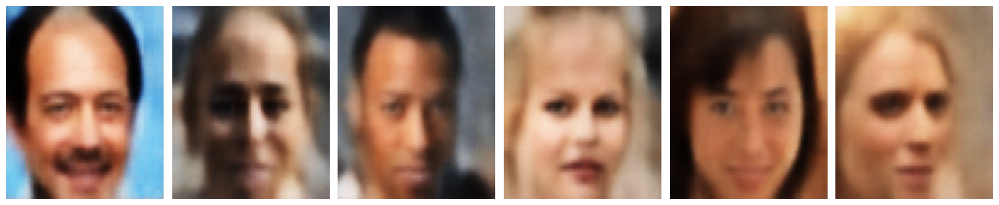

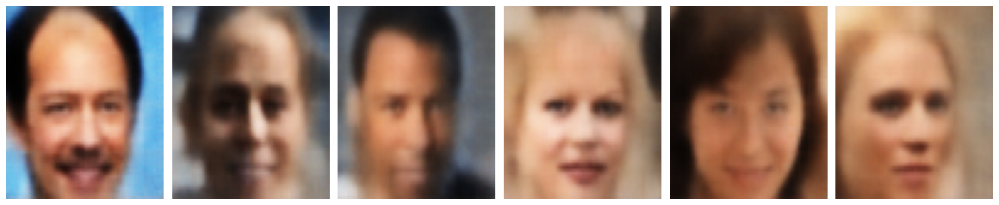

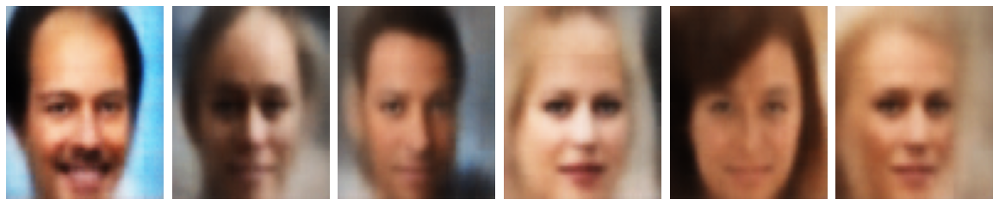

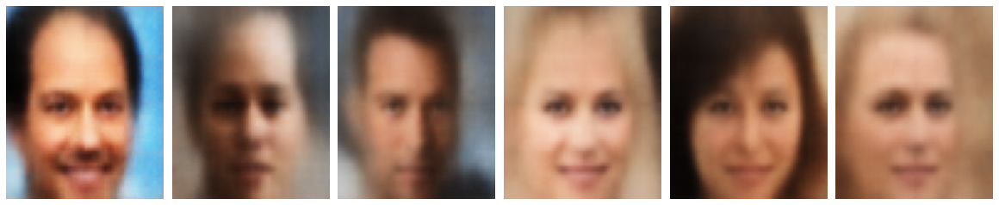

In [ ]:
for name, recon in recons.items():
    fig, axes = plt.subplots(1, 6, constrained_layout=True, figsize=plt.figaspect(0.2))
    for col in range(6):
        axes[col].imshow(recon[col], aspect=218/178)
        axes[col].axis("off")

    fig.show()
    plt.savefig(f"/content/plots/celeba_recon_{name}.pdf")

## Sampling

In [ ]:
key = jax.random.PRNGKey(42)
key, *key_Z = jax.random.split(key, 5)

generated_images = {}
for i, name in enumerate(configs):
    Z = jax.random.normal(key_Z[i], (8, latent_dim))
    generated_image = decode(states[name], Z)
    generated_images[name] = generated_image

Show a single figure montage

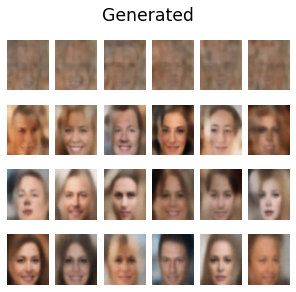

In [ ]:
fig, axes = plt.subplots(4, 6, constrained_layout=True, figsize=plt.figaspect(1))
for row, (name, generated_image) in enumerate(generated_images.items()):
    for col in range(6):
        axes[row, col].imshow(generated_image[col], aspect=218/178)
        axes[row, col].axis("off")

fig.suptitle("Generated", fontsize="xx-large")
fig.show()
plt.savefig("/content/plots/celeba_gen_montage.pdf")

Plot each row as a separate figure and then save them with meaningful filenames

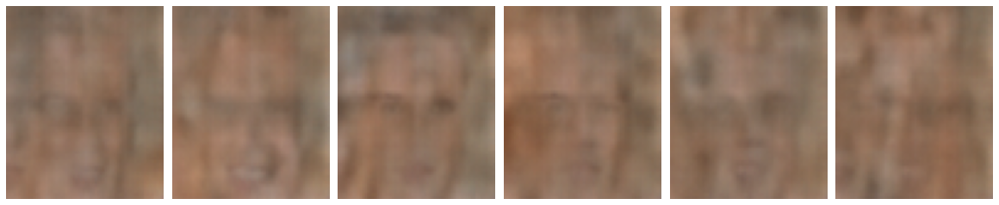

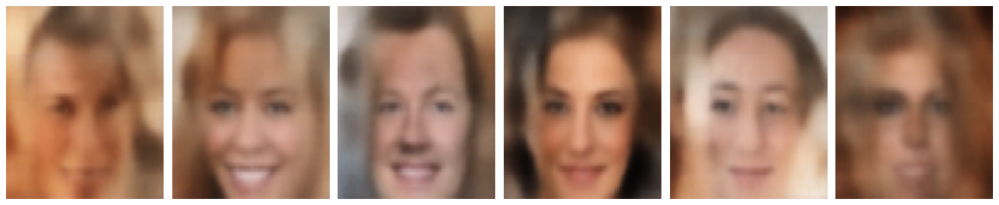

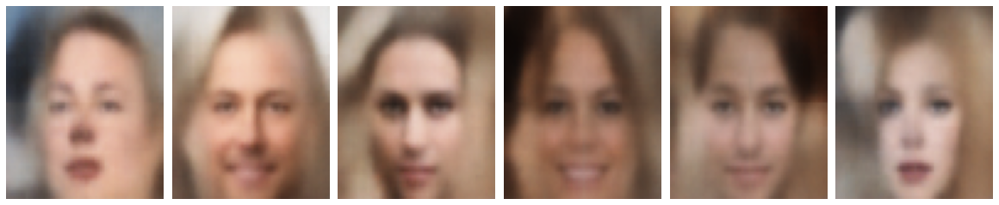

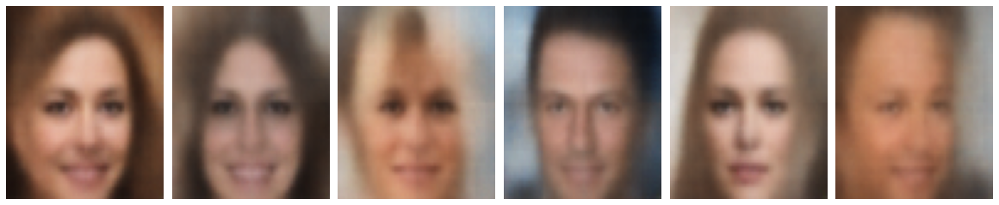

In [ ]:
for name, generated_image in generated_images.items():
    fig, axes = plt.subplots(1, 6, constrained_layout=True, figsize=plt.figaspect(0.2))
    for col in range(6):
        axes[col].imshow(generated_image[col], aspect=218/178)
        axes[col].axis("off")

    fig.show()
    plt.savefig(f"/content/plots/celeba_gen_{name}.pdf")

## Interpolation

In [ ]:
X, y = next(iter(loader_test))
image = jnp.array(X).reshape((-1, *specimen.shape)) / 255.0

means = {}
key = jax.random.PRNGKey(42)
key, *key_Z = jax.random.split(key, 5)
for i, name in enumerate(configs):
    _, mean, _ = test_step(states[name], key_Z[i], image)
    means[name] = mean, image

Show interpolation results

In [ ]:
def slerp(val, low, high):
    """Spherical interpolation. val has a range of 0 to 1."""
    if val <= 0:
        return low
    elif val >= 1:
        return high
    elif jnp.allclose(low, high):
        return low
    omega = jnp.arccos(jnp.dot(low / jnp.linalg.norm(low), high / jnp.linalg.norm(high)))
    so = jnp.sin(omega)
    return jnp.sin((1.0 - val) * omega) / so * low + jnp.sin(val * omega) / so * high


def interp(start_index, end_index):
    for name, (mean, image) in means.items():
        fig, axes = plt.subplots(1, 6, constrained_layout=True, figsize=plt.figaspect(0.2))

        # Anchors
        axes[0].imshow(image[start_index], aspect=218/178)
        axes[0].set_title("Start Image")
        axes[0].axis("off")
        axes[5].imshow(image[end_index], aspect=218/178)
        axes[5].set_title("End Image")
        axes[5].axis("off")

        # Interpolated images
        for col in range(1, 5):
            Z = slerp(col/5, mean[start_index], mean[end_index])
            recon = decode(states[name], Z)
            axes[col].imshow(recon[0], aspect=218/178)
            axes[col].set_title(f"{col/5}")
            axes[col].axis("off")

        fig.show()
        plt.savefig(f"/content/plots/celeba_interp_start{start_index}_end{end_index}_{name}.pdf")

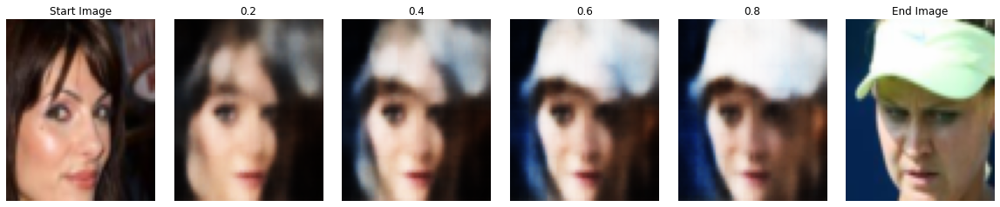

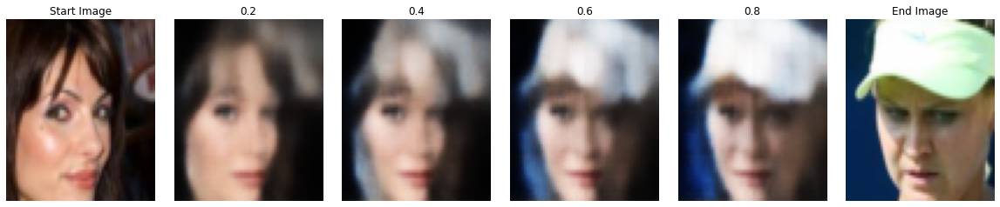

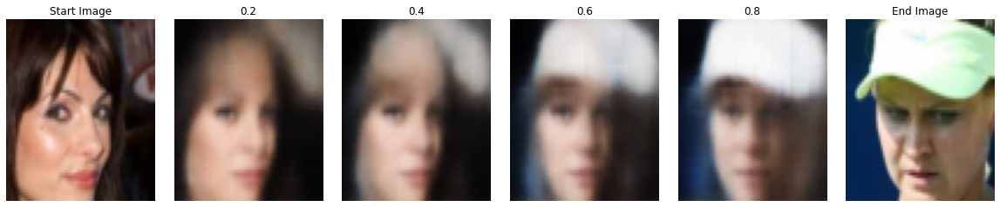

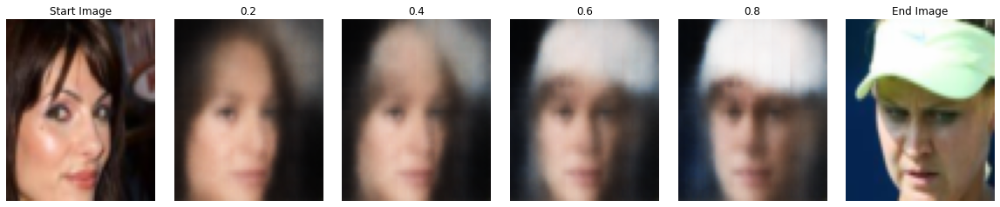

In [ ]:
interp(0, 1)

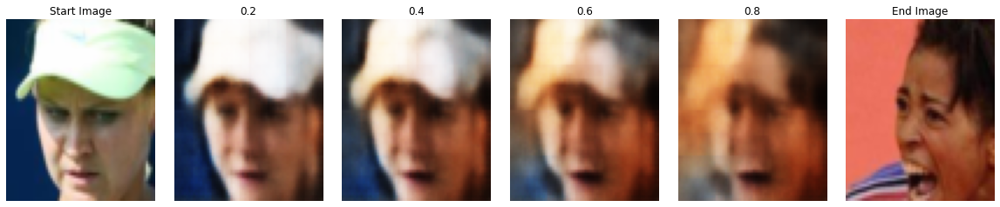

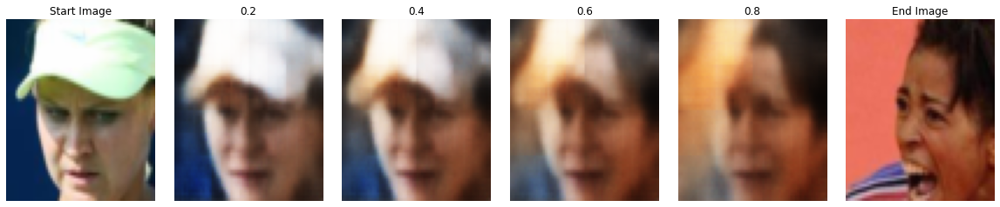

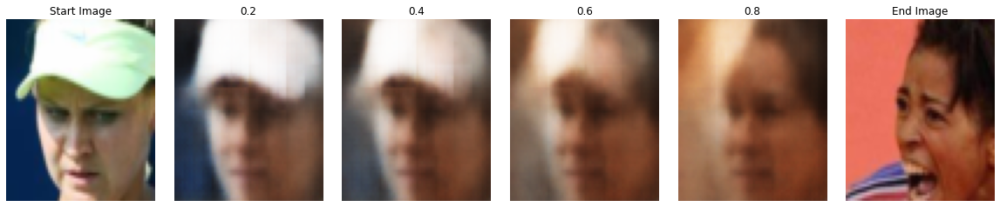

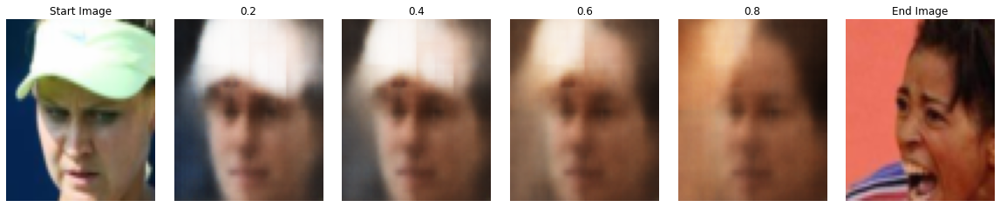

In [ ]:
interp(1, 2)

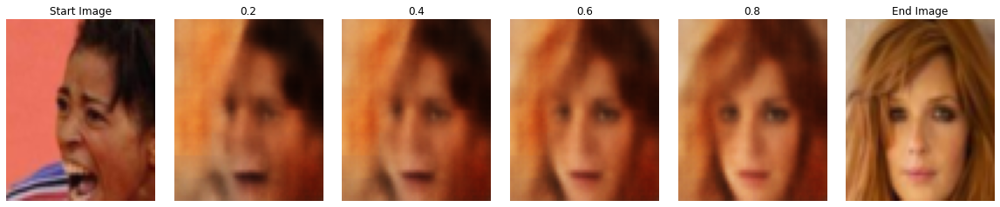

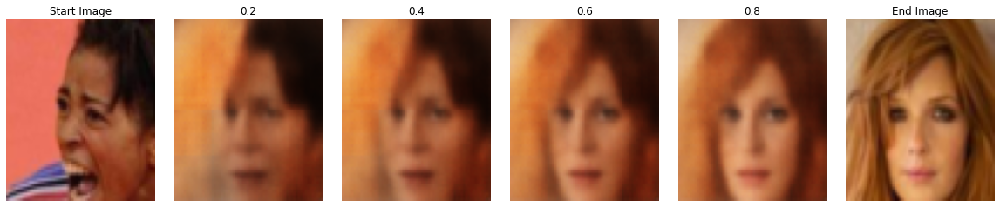

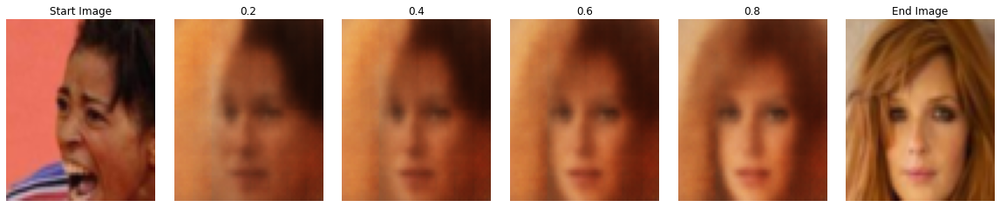

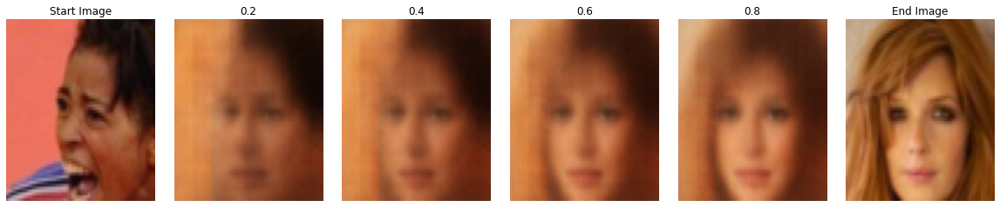

In [ ]:
interp(2, 3)

## Vector Arithmetic

Calculate the latent vector corresponding to whether the subject is wearing eyeglasses.

In [ ]:
eyeglasses_delta = {}
for name in configs:
    eyeglasses_delta[name] = (jnp.zeros((latent_dim,)), jnp.zeros((latent_dim,)), 0, 0)

eyeglasses_attr_idx = 15
key = jax.random.PRNGKey(42)
for X, y in loader_test:
    image = jnp.array(X).reshape((-1, *specimen.shape)) / 255.0
    key, *key_Z = jax.random.split(key, 5)
    for i, name in enumerate(configs):
        _, mean, _ = test_step(states[name], key_Z[i], image)
        sum_pos, sum_neg, count_pos, count_neg = eyeglasses_delta[name]
        eyeglass_mask = jnp.array(y[:, eyeglasses_attr_idx] == 1)
        sum_pos += mean[eyeglass_mask, :].sum(axis=0)
        sum_neg += mean[~eyeglass_mask, :].sum(axis=0)
        count_pos += eyeglass_mask.sum()
        count_neg += (~eyeglass_mask).sum()
        eyeglasses_delta[name] = sum_pos, sum_neg, count_pos, count_neg

In [ ]:
X, y = next(iter(loader_test))
image = jnp.array(X).reshape((-1, *specimen.shape)) / 255.0

va_means = {}
key = jax.random.PRNGKey(42)
key, *key_Z = jax.random.split(key, 5)
for i, name in enumerate(configs):
    _, mean, _ = test_step(states[name], key_Z[i], image)
    va_means[name] = mean, image

Show a single figure montage

In [ ]:
def arith_montage(image_index, multiplier):
    fig, axes = plt.subplots(4, 6, constrained_layout=True, figsize=plt.figaspect(1))
    for row, (name, (sum_pos, sum_neg, count_pos, count_neg)) in enumerate(eyeglasses_delta.items()):
        delta = sum_pos/count_pos - sum_neg/count_neg
        mean, image = va_means[name]
        axes[row, 0].set_title("Original")
        axes[row, 0].axis("off")
        axes[row, 0].imshow(image[image_index], aspect=218/178)
        for col in range(1, 6):
            coef = multiplier * (col - 3)
            Z = mean[image_index] + coef * delta
            recon = decode(states[name], Z)
            axes[row, col].set_title(f"{coef}")
            axes[row, col].axis("off")
            axes[row, col].imshow(recon[0], aspect=218/178)

    fig.show()
    plt.savefig(f"/content/plots/celeba_arith_img{image_index}_mul{multiplier}_montage.pdf")

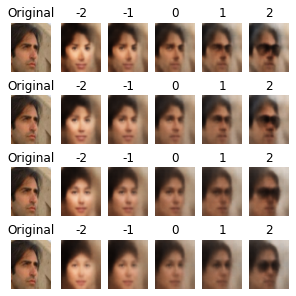

In [ ]:
arith_montage(0, 1)

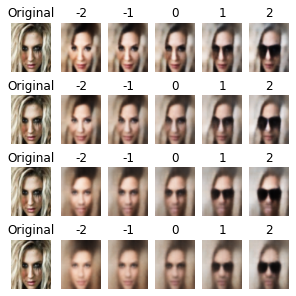

In [ ]:
arith_montage(1, 1)

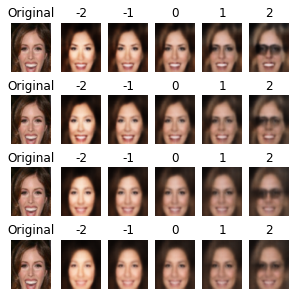

In [ ]:
arith_montage(2, 1)

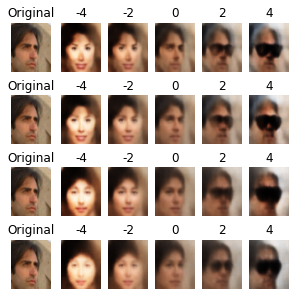

In [ ]:
arith_montage(0, 2)

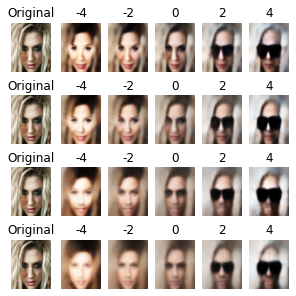

In [ ]:
arith_montage(1, 2)

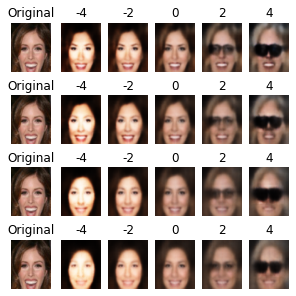

In [ ]:
arith_montage(2, 2)

Plot each row as a separate figure and then save them with meaningful filenames

In [ ]:
def arith(image_index, multiplier):
    for name, (sum_pos, sum_neg, count_pos, count_neg) in eyeglasses_delta.items():
        fig, axes = plt.subplots(1, 6, constrained_layout=True, figsize=plt.figaspect(0.2))
        delta = sum_pos/count_pos - sum_neg/count_neg
        mean, image = va_means[name]
        axes[0].set_title("Original")
        axes[0].axis("off")
        axes[0].imshow(image[image_index], aspect=218/178)
        for col in range(1, 6):
            coef = multiplier * (col - 3)
            Z = mean[image_index] + coef * delta
            recon = decode(states[name], Z)
            axes[col].set_title(f"{coef}")
            axes[col].axis("off")
            axes[col].imshow(recon[0], aspect=218/178)
            
        fig.show()
        plt.savefig(f"/content/plots/celeba_arith_img{image_index}_mul{multiplier}_{name}.pdf")

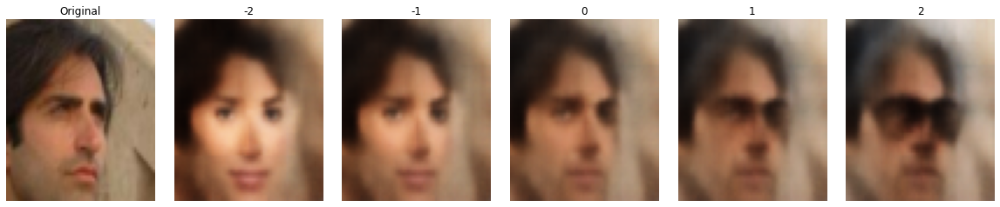

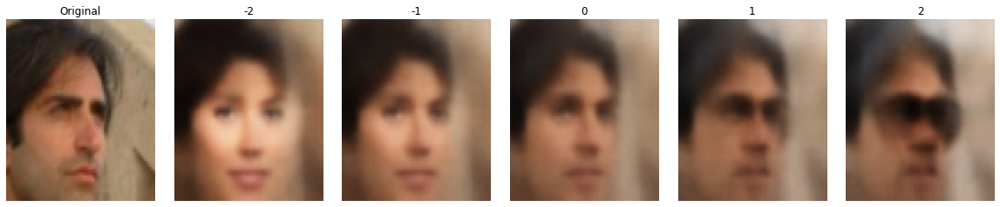

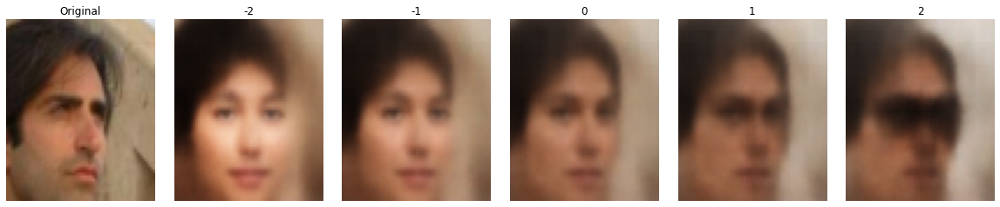

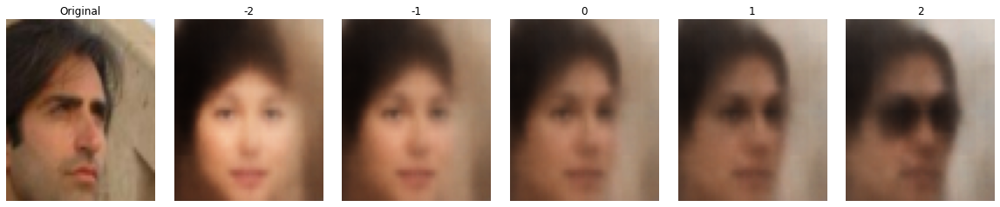

In [ ]:
arith(0, 1)

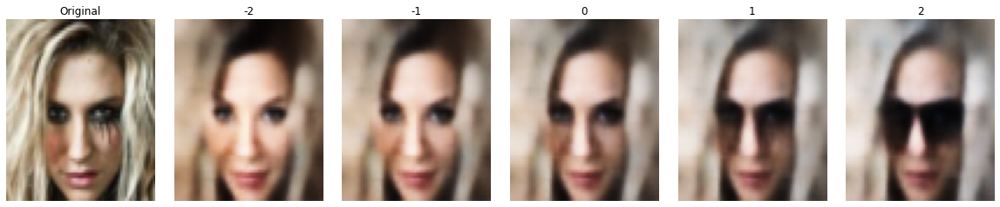

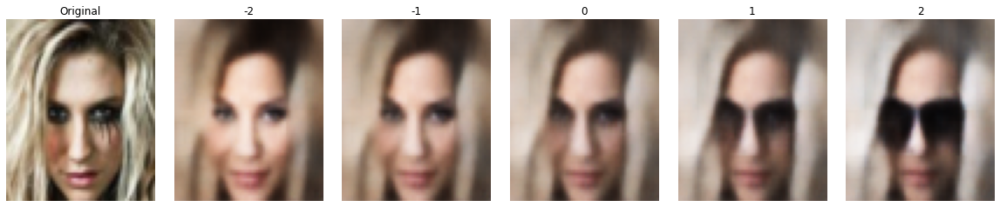

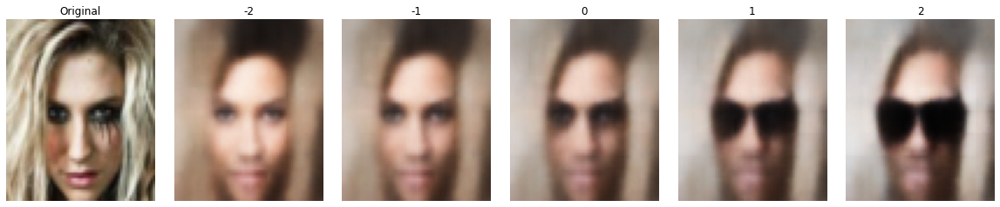

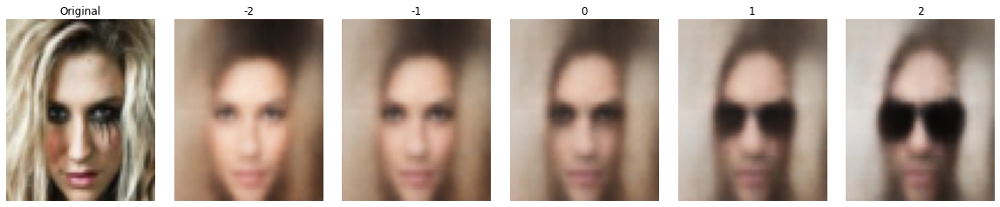

In [ ]:
arith(1, 1)

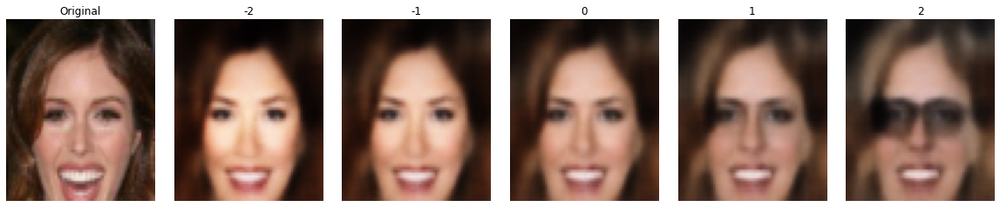

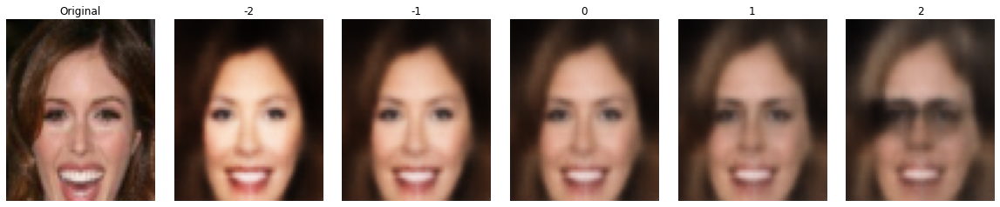

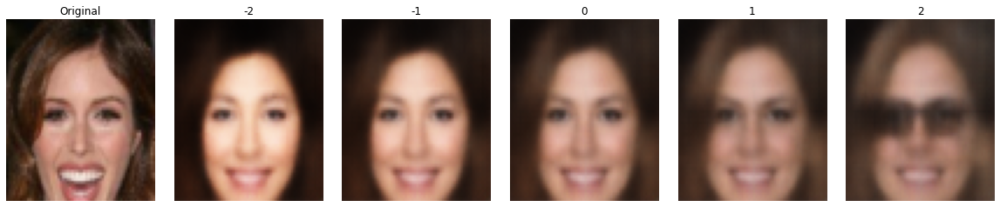

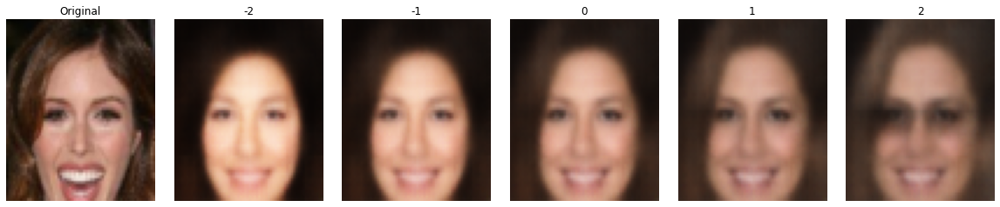

In [ ]:
arith(2, 1)

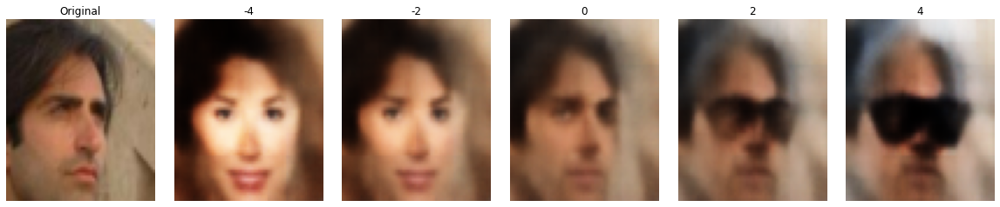

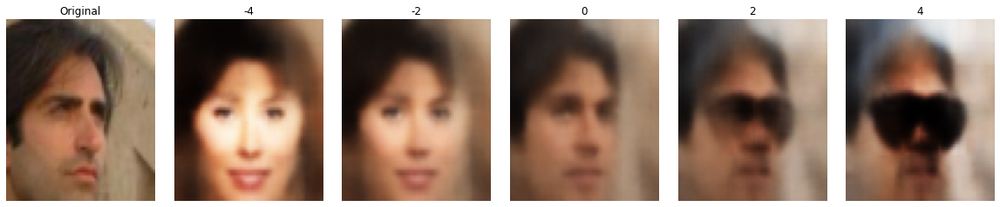

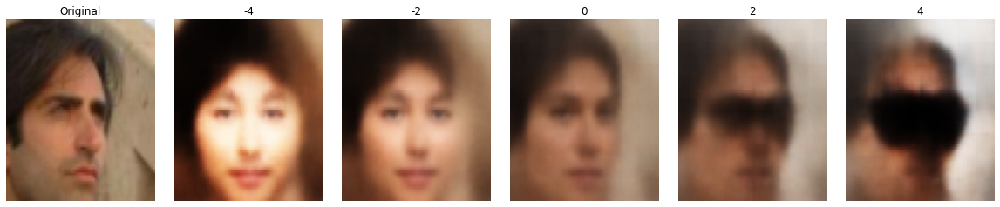

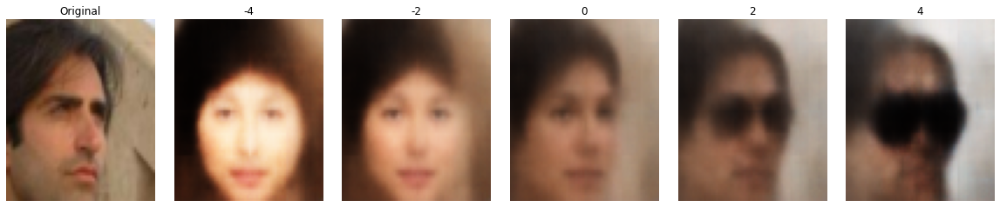

In [ ]:
arith(0, 2)

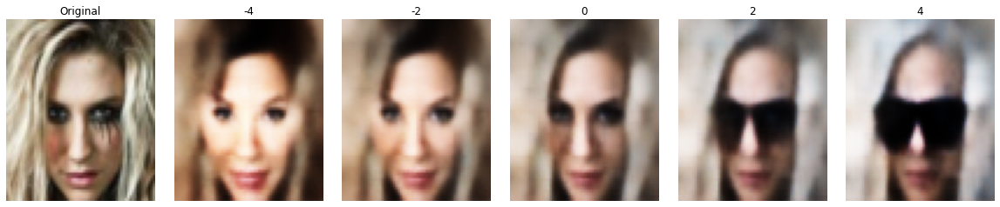

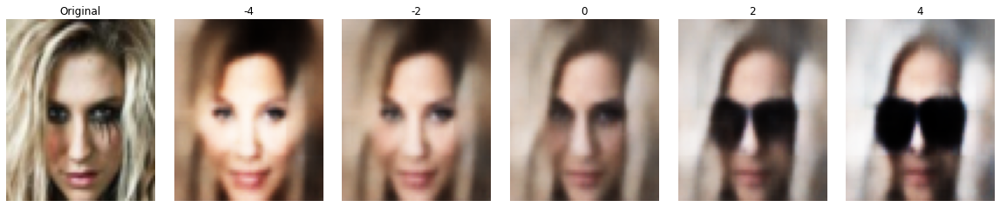

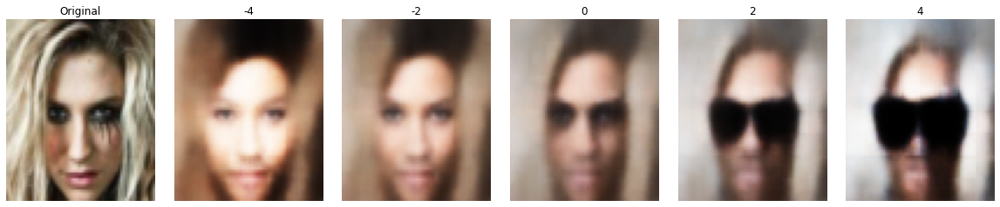

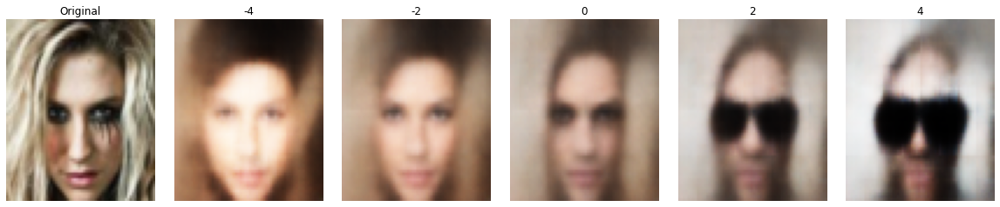

In [ ]:
arith(1, 2)

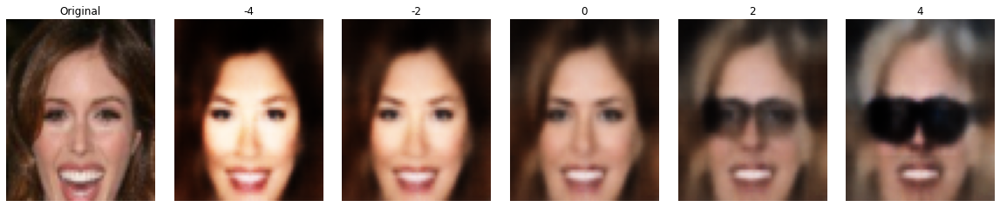

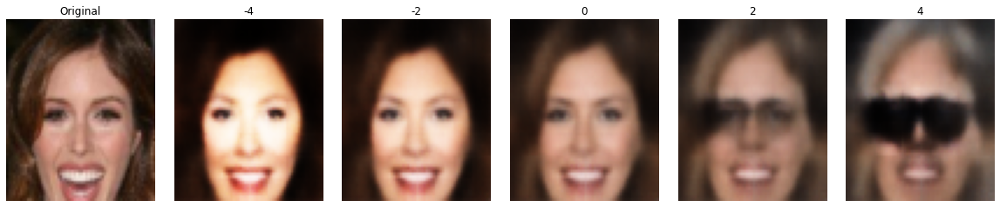

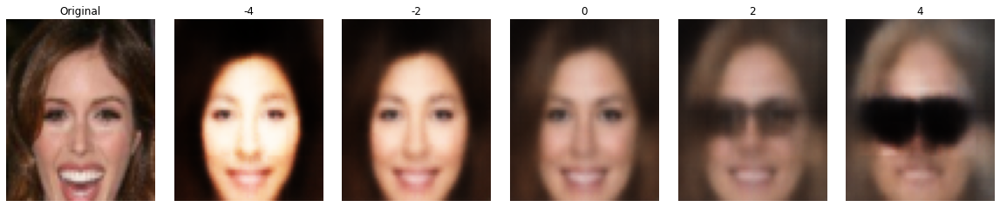

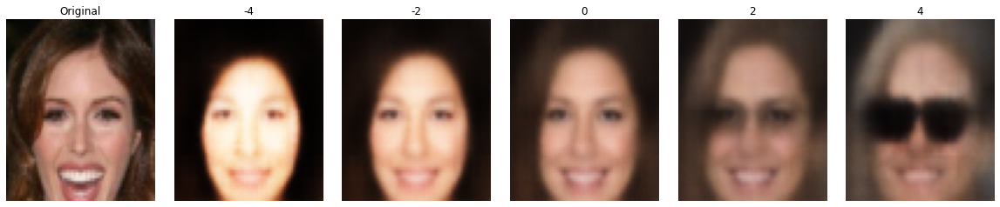

In [ ]:
arith(2, 2)

## Zipping plots for easier download

In [ ]:
!zip -q -r /content/plots.zip /content/plots